In [1]:
import os
from os.path import expanduser
home = expanduser("~/")

import sys
# sys.path.insert(0, '/global/u2/x/xshuang/gigalens-xh-dev/src')

# import sys
conda_env = sys.path[1]
del sys.path[1]

import os
# sys.path.append(f'{os.environ['HOME']}/gigalens_personal/gigalens/src')
sys.path.append(home+'/gigalens'+'/src')
sys.path.append(conda_env)
print(sys.path)



srcdir = os.path.join(home, "gigalens/src/")
sys.path.append("..")

['', '/usr/lib/python312.zip', '/usr/lib/python3.12', '/usr/lib/python3.12/lib-dynload', '/usr/local/lib/python3.12/dist-packages', '__editable__.flax-0.10.6.finder.__path_hook__', '__editable__.jax_cuda12_pjrt-0.6.2.dev20250607.finder.__path_hook__', '__editable__.jax_cuda12_plugin-0.6.2.dev20250607.finder.__path_hook__', '__editable__.nsys_jax-0.1.dev1163+g4a8f06a.finder.__path_hook__', '/opt/pip/src', '/usr/lib/python3/dist-packages', '/global/homes/l/linusu//gigalens/src', '/global/homes/l/linusu/.conda/envs/gigalens_multinode_env/lib/python3.12/site-packages']


In [ ]:
import tensorflow_probability.substrates.jax as tfp

from gigalens.jax.inference import ModellingSequence
from gigalens.jax.model import ForwardProbModel, BackwardProbModel
from gigalens.model import PhysicalModel
from gigalens.jax.simulator import LensSimulator
from gigalens.simulator import SimulatorConfig
from gigalens.jax.profiles.light import sersic
from gigalens.jax.profiles.mass import epl, shear

import jax
from jax import random
import numpy as np
import optax
from jax import numpy as jnp
from matplotlib import pyplot as plt
import optax
import corner
import yaml
import pickle
from helpers import *
import blackjax
tfd = tfp.distributions

2026-01-03 17:00:34.960674: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1767488435.256289 2070369 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1767488435.306998 2070369 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1767488435.726037 2070369 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767488435.726053 2070369 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking the same target more than once.
W0000 00:00:1767488435.726055 2070369 computation_placer.cc:177] computation placer alr

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

AttributeError: 'MessageFactory' object has no attribute 'GetPrototype'

In [ ]:
prior = make_default_prior()
gigal_dir = os.path.join(home,'gigalens/src/gigalens')
kernel = np.load(gigal_dir + '/assets/psf.npy').astype(np.float32)
sim_config = SimulatorConfig(delta_pix=0.065, num_pix=60, supersample=2, kernel=kernel)
phys_model = PhysicalModel([epl.EPL(50), shear.Shear()], [sersic.SersicEllipse(use_lstsq=False)], [sersic.SersicEllipse(use_lstsq=False)])
lens_sim = LensSimulator(phys_model, sim_config, bs=1)
observed_img = np.load(gigal_dir + '/assets/demo.npy')
prob_model = ForwardProbModel(prior, observed_img, background_rms=0.2, exp_time=100)
model_seq = ModellingSequence(phys_model, prob_model, sim_config)

In [ ]:
map_opt = optax.adabelief(1e-2, b1=0.95, b2=0.99, nesterov=True)
map_samples, map_lps, map_chisqs = model_seq.MAP_multi(map_opt, num_steps=500, return_full_history=True)

In [ ]:
map_lp_history = jnp.nanmax(map_lps, axis=1)
best_lp_step_idx = jnp.argmax(map_lp_history)
best_sample_idx = jnp.argmax(map_lps[best_lp_step_idx])
best_trajectory = map_samples[:, best_sample_idx]

In [ ]:
def log_prob(z):
    return prob_model.log_prob(lens_sim, z)[0]

lp_and_grad = jax.jit(jax.value_and_grad(log_prob))
vectorized_lp_and_grad = jax.jit(jax.vmap(lp_and_grad, in_axes=0))

hess = jax.jit(jax.hessian(log_prob))
vectorized_hess = jax.jit(jax.vmap(hess, in_axes=0))

In [ ]:
trajectory_lp, trajectory_grad = vectorized_lp_and_grad(best_trajectory)

In [ ]:
idxes = np.arange(0, trajectory_lp.shape[0], 5)
MAP_hess = vectorized_hess(best_trajectory[idxes])

In [ ]:
ax1 = plt.gca()
egvals, egvecs = jnp.linalg.eig(MAP_hess)

ax1.plot(trajectory_lp.shape[0] -trajectory_lp, label="# of eigvals")
ax1.set_ylabel("Negated Log Prob")
ax1.set_xlabel("Step")

ax2 = ax1.twinx()
ax2.plot(idxes, np.sum(egvals > 0, axis=1), color="red", label="-lp")
ax2.set_ylabel("# of negative eigenvalues in 'covariance' (max 22)")

ax1.set_title("Quality of Hessian-informed surrogates over MAP")
plt.show()

In [51]:
i = 400#idxes[-1]
map_hess_cov = -jnp.linalg.inv(MAP_hess[-1])

#! Flip negative eigenvalues of map_hess_cov
M, S = jnp.linalg.eig(map_hess_cov)
map_hess_cov = np.real(S @ jnp.diag(jnp.abs(M)) @ jnp.linalg.inv(S))

map_hess_mean = best_trajectory[i] + map_hess_cov @ trajectory_grad[i]
map_hess_qz = tfp.distributions.MultivariateNormalFullCovariance(loc=map_hess_mean, covariance_matrix=map_hess_cov)

In [52]:
elbo_lens_sim = LensSimulator(phys_model, sim_config, bs=1000)
def elbo(qz_calc):
    z = qz_calc.sample(1000, seed=jax.random.PRNGKey(0))
    lps = qz_calc.log_prob(z)
    model_log_prob = prob_model.log_prob(elbo_lens_sim, z)[0]

    return jnp.mean(lps - model_log_prob)

In [53]:
map_hess_elbo = elbo(map_hess_qz)

In [54]:
print(map_hess_elbo)
print(results['SVI'].SVI_loss_hist[-1])

-53.266815
-52.070324


In [55]:
# cfg = PipelineConfig(steps=["MAP", "SVI", "HMC"], map_kwargs=dict(num_steps=350, n_samples=500),
#     svi_kwargs=dict(num_steps=1500, n_vi=500))

# results = run_pipeline(model_seq, cfg)

In [56]:
# results["MAP"].save(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"))
# results["SVI"].save(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"))
# results["HMC"].save(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"))

In [57]:
results = {}
results["MAP"] = MAPResults.load(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"), model_seq)
results["SVI"] = SVIResults.load(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"), model_seq)
results["HMC"] = HMCResults.load(os.path.join(home, "GIGALens-Code/alternate_inference/test_system"), model_seq)


In [58]:
def log_prob(z):
    return prob_model.log_prob(lens_sim, z)[0]

qz_mean = jnp.squeeze(results['SVI'].qz.mean())
qz_cov = results['SVI'].qz.covariance()

HMC_cov = jnp.cov(results['HMC'].HMC_samples_z.reshape(-1, 22).T)
rng_key = jax.random.key(0)

In [59]:
stop = 0
while stop == 0:
    rng_key, init_key, infer_key = jax.random.split(rng_key, 3)
    w0 = jnp.squeeze(results["MAP"].best_z)
    # w0 = jax.random.multivariate_normal(init_key, 2.0 + jnp.zeros(M), jnp.eye(M))
    _, info = blackjax.vi.pathfinder.approximate(infer_key, log_prob, w0, ftol=1e-6)
    path = info.path
    stop = np.isfinite(path.elbo).mean()

2026-01-03 12:53:50.308478: E external/xla/xla/service/slow_operation_alarm.cc:73] Trying algorithm eng2{k2=2,k3=0} for conv %cudnn-conv-bw-input = (f32[1,1,120,120]{3,2,1,0}, u8[0]{0}) custom-call(%reduce-window.0, %Arg_180.181), window={size=25x25 pad=12_12x12_12}, dim_labels=bf01_oi01->bf01, custom_call_target="__cudnn$convBackwardInput", metadata={op_name="jit(log_prob)/jit(main)/jit(simulate)/conv_general_dilated" source_file="/global/homes/l/linusu//gigalens/src/gigalens/jax/simulator.py" source_line=80}, backend_config={"operation_queue_id":"0","wait_on_operation_queues":[],"cudnn_conv_backend_config":{"conv_result_scale":1,"activation_mode":"kNone","side_input_scale":0,"leakyrelu_alpha":0},"force_earliest_schedule":false,"reification_cost":[]} is taking a while...
2026-01-03 12:53:50.853201: E external/xla/xla/service/slow_operation_alarm.cc:140] The operation took 1.544811836s
Trying algorithm eng2{k2=2,k3=0} for conv %cudnn-conv-bw-input = (f32[1,1,120,120]{3,2,1,0}, u8[0]{0}

In [60]:
path.position.shape

(31, 22)

In [68]:
smp = results['HMC'].HMC_samples_z.reshape(-1, 22)
hmc_cov = jnp.cov(smp.T)
qz_HMC_fit = tfp.distributions.MultivariateNormalFullCovariance(loc=jnp.mean(smp, axis=0), covariance_matrix=hmc_cov)
print(elbo(qz_HMC_fit))

-51.642776


In [61]:
path_x = prob_model.bij.forward(list(path.position.T))
tups = [(0, 0), (0, 1), (1, 0), (2, 0)]
path_plot = np.vstack([np.array(list(path_x[i][j].values())) for i, j in tups]).T


map_best_plot = np.vstack([np.array(list(results["MAP"].MAP_best[i][j].values())) for i, j in tups]).T

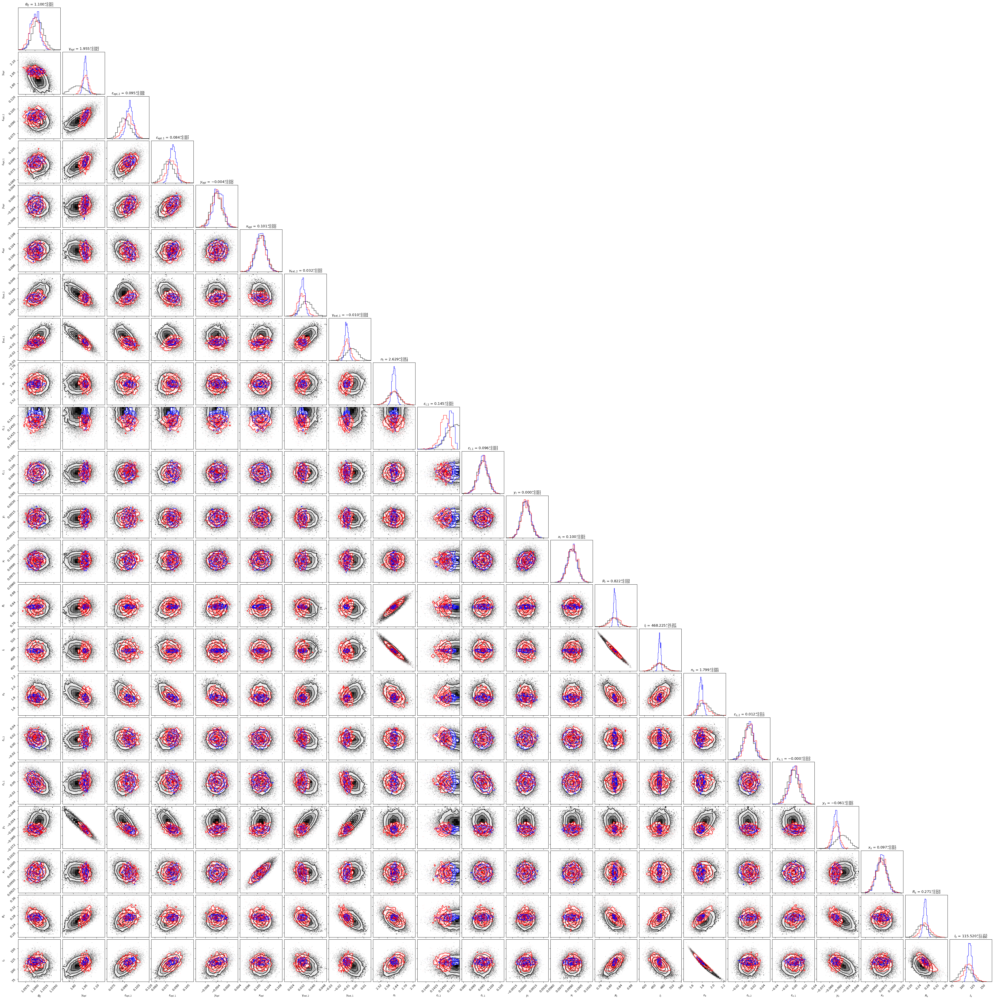

In [69]:

MAP_hess_samples = map_hess_qz.sample((1000,), rng_key)
MAP_hess_x = prob_model.bij.forward(list(MAP_hess_samples.T))

fig = cornerplot_posterior(results['HMC'].HMC_samples, color='black')
cornerplot_posterior(results['SVI'].SVI_samples, fig=fig, color='blue')
cornerplot_posterior(MAP_hess_x, fig=fig, color='red')
# corner.overplot_points(fig, path_plot, marker="*", color="C1")
# corner.overplot_points(fig, map_best_plot, marker="*", color="red")

plt.show()